In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/LICENSE
/kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/README.md
/kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/data.yaml
/kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/classes.txt
/kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/labels/val/000000061651.txt
/kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/labels/val/000000046509.txt
/kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/labels/val/000000280785.txt
/kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/labels/val/000000234858.txt
/kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-datase

In [2]:
import kagglehub
import os

# Download latest version
path = kagglehub.dataset_download("haseebhsb/yolo-person-vehicle-detection-dataset-annotated")
print("Path to dataset files:", path)

# Store the dataset path
dataset_path = path
print(f"\nDataset downloaded to: {dataset_path}")


Path to dataset files: /kaggle/input/yolo-person-vehicle-detection-dataset-annotated

Dataset downloaded to: /kaggle/input/yolo-person-vehicle-detection-dataset-annotated


In [3]:
import os

# Check if the directory exists
if os.path.exists(dataset_path):
    print(f"Contents of '{dataset_path}':")
    for item in os.listdir(dataset_path):
        print(item)
else:
    print(f"Error: Directory '{dataset_path}' not found.")


Contents of '/kaggle/input/yolo-person-vehicle-detection-dataset-annotated':
yolo-person-vehicle-dataset


In [4]:
import os

# First, let's check what's actually in the dataset path
print(f"Exploring dataset structure in: {dataset_path}\n")

# Function to explore directory structure
def explore_directory(path, max_depth=3, current_depth=0):
    if current_depth > max_depth:
        return
    
    try:
        items = os.listdir(path)
        indent = "  " * current_depth
        print(f"{indent}Contents of '{path}':")
        
        for item in items:
            item_path = os.path.join(path, item)
            if os.path.isdir(item_path):
                print(f"{indent}  📁 {item}/")
                if current_depth < max_depth:
                    explore_directory(item_path, max_depth, current_depth + 1)
            else:
                print(f"{indent}  📄 {item}")
    except Exception as e:
        print(f"{indent}Error accessing {path}: {e}")

explore_directory(dataset_path, max_depth=2)

# Now try to find the correct dataset subdirectory
possible_paths = [
    os.path.join(dataset_path, 'dataset'),
    dataset_path,  # Sometimes the dataset folder IS the root
]

dataset_sub_path = None
for path in possible_paths:
    if os.path.exists(path):
        # Check if this path has 'images' and 'labels' folders
        contents = os.listdir(path)
        if 'images' in contents and 'labels' in contents:
            dataset_sub_path = path
            print(f"\n✅ Found dataset directory: {dataset_sub_path}")
            break

if dataset_sub_path is None:
    # If still not found, search for images and labels folders
    for root, dirs, files in os.walk(dataset_path):
        if 'images' in dirs and 'labels' in dirs:
            dataset_sub_path = root
            print(f"\n✅ Found dataset directory: {dataset_sub_path}")
            break

if dataset_sub_path:
    print(f"\nContents of dataset directory:")
    for item in os.listdir(dataset_sub_path):
        print(f"  - {item}")
else:
    print("\n❌ Could not find dataset directory with 'images' and 'labels' folders")


Exploring dataset structure in: /kaggle/input/yolo-person-vehicle-detection-dataset-annotated

Contents of '/kaggle/input/yolo-person-vehicle-detection-dataset-annotated':
  📁 yolo-person-vehicle-dataset/
  Contents of '/kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset':
    📁 dataset/
    Contents of '/kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset':
      📁 labels/
      📁 images/
      📄 classes.txt
    📄 LICENSE
    📄 README.md
    📄 data.yaml

✅ Found dataset directory: /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset

Contents of dataset directory:
  - labels
  - images
  - classes.txt


In [5]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 18.6 MB/s eta 0:00:00


In [6]:
import ultralytics

print(f"Ultralytics version: {ultralytics.__version__}")


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics version: 8.4.7


In [7]:
!nvidia-smi

Sat Jan 24 14:45:16 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 570.172.08             Driver Version: 570.172.08     CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   30C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [8]:
import yaml
import os
from pathlib import Path

# Define DATASET_DIR (where the data is located - read-only)
DATASET_DIR = Path(dataset_sub_path)

# Define working directory (writable) for saving the YAML file
WORKING_DIR = Path('/kaggle/working')

# Read class names from classes.txt
classes_file = DATASET_DIR / 'classes.txt'
if classes_file.exists():
    with open(classes_file, 'r') as f:
        classes = [line.strip() for line in f if line.strip()]
else:
    classes = []
    print(f"Warning: '{classes_file}' not found or is empty. 'classes' list is empty.")

# Define yolo_data_config dictionary
yolo_data_config = {
    'path': str(DATASET_DIR.resolve()),
    'train': 'images/train',
    'val': 'images/val',
    'nc': len(classes),
    'names': classes
}

# Save the YAML file to /kaggle/working/ (writable directory)
yolo_yaml_path = WORKING_DIR / 'data_yolo.yaml'

# Write the configuration to the file
with open(yolo_yaml_path, 'w') as f:
    yaml.dump(yolo_data_config, f, sort_keys=False)

# Print confirmation
print(f"'data_yolo.yaml' file saved to: {yolo_yaml_path}\n")

print("Content of data_yolo.yaml:")
with open(yolo_yaml_path, 'r') as f:
    print(f.read())


'data_yolo.yaml' file saved to: /kaggle/working/data_yolo.yaml

Content of data_yolo.yaml:
path: /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset
train: images/train
val: images/val
nc: 2
names:
- person
- vehicle



In [9]:
from ultralytics import YOLO

# Load a pre-trained YOLOv8n model
model = YOLO('yolov8n.pt')

# Train the model
print("Initiating model training...")
model.train(data=str(yolo_yaml_path), epochs=15, imgsz=640, batch=16)
print("Model training completed.")


Initiating model training...
Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data_yolo.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=15, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10

In [10]:
from ultralytics import YOLO

# Load the trained model
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

# Evaluate the model on the validation set
print("Evaluating model performance...")
metrics = model.val(data=str(yolo_yaml_path))

# Print evaluation metrics
print("\nModel Evaluation Results:")
print(f"  mAP50-95: {metrics.box.map:.3f}")
print(f"  mAP50: {metrics.box.map50:.3f}")
print(f"  mAP75: {metrics.box.map75:.3f}")
print(f"  Precision: {metrics.box.mp:.3f}")
print(f"  Recall: {metrics.box.mr:.3f}")


Evaluating model performance...
Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 73 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 234.8±97.7 MB/s, size: 176.1 KB)
val: Scanning /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/labels/val... 400 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 400/400 742.7it/s 0.5s
WARNING ⚠️ val: Cache directory /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/labels is not writable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 25/25 6.7it/s 3.7s
                   all        400        791      0.879      0.852      0.928      0.707
                person        264        467      0.908      0.849      0.944      0.674
               vehicle        208        32

In [11]:
from ultralytics import YOLO
from pathlib import Path

# Load the best trained model
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

# Define the directory for sample images
sample_images_dir = Path(dataset_sub_path) / 'images' / 'val'

# Perform inference
print("Running inference on sample images...")
results = model.predict(source=str(sample_images_dir), save=True, conf=0.25, iou=0.7)
print("Inference complete. Predictions saved.")

Running inference on sample images...

image 1/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000028302.jpg: 448x640 1 vehicle, 38.2ms
image 2/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000029396.jpg: 480x640 1 person, 1 vehicle, 38.7ms
image 3/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000029743.jpg: 480x640 1 vehicle, 6.0ms
image 4/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000030291.jpg: 640x640 1 vehicle, 7.9ms
image 5/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000030858.jpg: 480x640 1 vehicle, 6.4ms
image 6/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/00000003

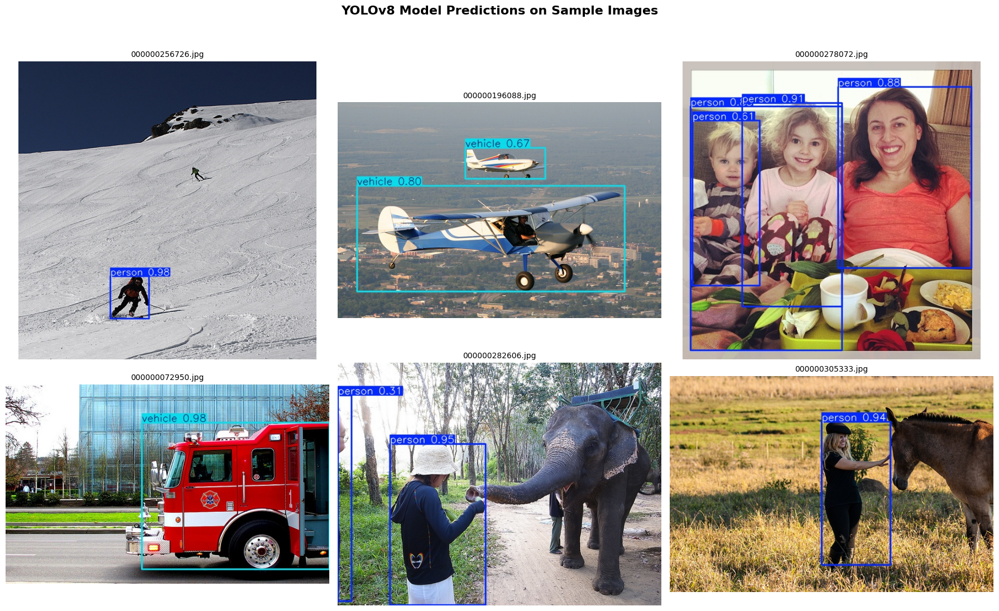

In [12]:
import random
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

# Get the directory where predict saved the results
prediction_output_dir = Path('/kaggle/working/runs/detect/predict')

# Get all image files from the prediction output directory
predicted_images = list(prediction_output_dir.glob('*.jpg')) + list(prediction_output_dir.glob('*.png'))

if predicted_images:
    # Select a random subset of images to display
    display_samples = random.sample(predicted_images, min(6, len(predicted_images)))

    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()

    for idx, img_path in enumerate(display_samples):
        img = Image.open(img_path)
        axes[idx].imshow(img)
        axes[idx].set_title(img_path.name, fontsize=10)
        axes[idx].axis('off')

    plt.suptitle('YOLOv8 Model Predictions on Sample Images', fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()
else:
    print("No predicted images found to display.")


In [13]:
from ultralytics import YOLO

# Load pre-trained YOLOv10n model
model = YOLO('yolov10n.pt')
print("YOLOv10n model loaded successfully.")

# Train with optimized parameters
print("Initiating optimized YOLOv10n training...")

model.train(
    data=str(yolo_yaml_path),
    epochs=50,
    imgsz=640,
    batch=16,
    augment=True,
    patience=0,
    save=True,
    verbose=True,
    plots=True,
    name='yolov10n_person_vehicle_full_epochs',
)

print("YOLOv10n training completed.")

YOLOv10n model loaded successfully.
Initiating optimized YOLOv10n training...
Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data_yolo.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov10n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov10n_person_vehicle_full_epochs, nbs=64, nms=Fa

In [14]:
from ultralytics import YOLO

# Load the trained YOLOv10n model's best weights
model = YOLO('/kaggle/working/runs/detect/yolov10n_person_vehicle_full_epochs/weights/best.pt')

# Evaluate the model on the validation set
print("Evaluating YOLOv10n model performance...")
metrics_yolov10 = model.val(data=str(yolo_yaml_path))

# Print evaluation metrics for YOLOv10n
print("\nYOLOv10n Model Evaluation Results:")
print(f"  mAP50-95: {metrics_yolov10.box.map:.3f}")
print(f"  mAP50: {metrics_yolov10.box.map50:.3f}")
print(f"  mAP75: {metrics_yolov10.box.map75:.3f}")
print(f"  Precision: {metrics_yolov10.box.mp:.3f}")
print(f"  Recall: {metrics_yolov10.box.mr:.3f}")


Evaluating YOLOv10n model performance...
Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10n summary (fused): 102 layers, 2,265,558 parameters, 0 gradients, 6.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 310.6±123.6 MB/s, size: 165.3 KB)
val: Scanning /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/labels/val... 400 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 400/400 776.9it/s 0.5s
WARNING ⚠️ val: Cache directory /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/labels is not writable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 25/25 7.8it/s 3.2s
                   all        400        791      0.896       0.84      0.905      0.697
                person        264        467      0.904      0.831      0.914      0.663
               vehicle       

Running inference on sample images using YOLOv10n...

image 1/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000028302.jpg: 448x640 1 vehicle, 14.9ms
image 2/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000029396.jpg: 480x640 1 person, 1 vehicle, 14.5ms
image 3/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000029743.jpg: 480x640 (no detections), 7.3ms
image 4/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000030291.jpg: 640x640 1 vehicle, 8.2ms
image 5/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000030858.jpg: 480x640 1 vehicle, 7.6ms
image 6/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/datase

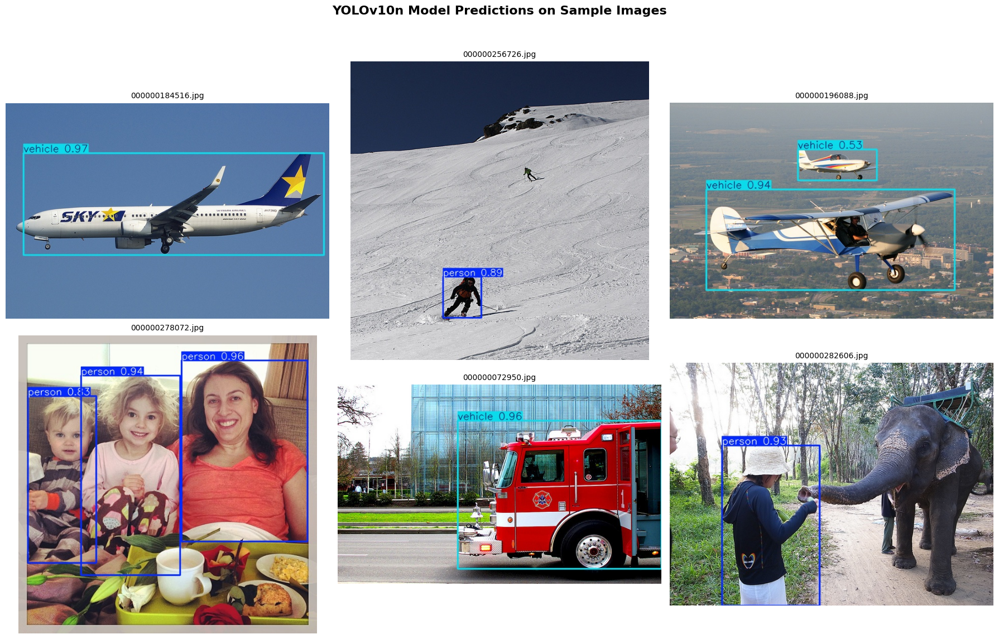

In [15]:
import random
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

# Load the best trained YOLOv10n model
model_yolov10 = YOLO('/kaggle/working/runs/detect/yolov10n_person_vehicle_full_epochs/weights/best.pt')

# Define the directory for sample images
sample_images_dir = Path(dataset_sub_path) / 'images' / 'val'

# Perform inference
print("Running inference on sample images using YOLOv10n...")
results_yolov10 = model_yolov10.predict(source=str(sample_images_dir), save=True, conf=0.25, iou=0.7, name='predict_yolov10')
print("YOLOv10n inference complete. Predictions saved.")

# Get the directory where predict saved the results for YOLOv10n
prediction_output_dir_yolov10 = Path('/kaggle/working/runs/detect/predict_yolov10')

# Get all image files from the prediction output directory
predicted_images_yolov10 = list(prediction_output_dir_yolov10.glob('*.jpg')) + list(prediction_output_dir_yolov10.glob('*.png'))

if predicted_images_yolov10:
    # Select a random subset of images to display
    display_samples_yolov10 = random.sample(predicted_images_yolov10, min(6, len(predicted_images_yolov10)))

    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()

    for idx, img_path in enumerate(display_samples_yolov10):
        img = Image.open(img_path)
        axes[idx].imshow(img)
        axes[idx].set_title(img_path.name, fontsize=10)
        axes[idx].axis('off')

    plt.suptitle('YOLOv10n Model Predictions on Sample Images', fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()
else:
    print("No predicted images found to display for YOLOv10n.")


In [16]:
from ultralytics import YOLO

# Load a pre-trained YOLOv11n model (replacing YOLOv8n)
model = YOLO('yolo11n.pt')

# Train the model
print("Initiating YOLOv11n model training...")
model.train(data=str(yolo_yaml_path), epochs=15, imgsz=640, batch=16)
print("YOLOv11n model training completed.")

Initiating YOLOv11n model training...
Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data_yolo.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=15, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, p

In [17]:
from ultralytics import YOLO

# Load the trained YOLOv11n model
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

# Evaluate the model on the validation set
print("Evaluating YOLOv11n model performance...")
metrics = model.val(data=str(yolo_yaml_path))

# Print evaluation metrics
print("\nYOLOv11n Model Evaluation Results:")
print(f"  mAP50-95: {metrics.box.map:.3f}")
print(f"  mAP50: {metrics.box.map50:.3f}")
print(f"  mAP75: {metrics.box.map75:.3f}")
print(f"  Precision: {metrics.box.mp:.3f}")
print(f"  Recall: {metrics.box.mr:.3f}")


Evaluating YOLOv11n model performance...
Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 73 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 271.8±106.6 MB/s, size: 165.3 KB)
val: Scanning /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/labels/val... 400 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 400/400 742.3it/s 0.5s
WARNING ⚠️ val: Cache directory /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/labels is not writable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 25/25 6.8it/s 3.7s
                   all        400        791      0.879      0.852      0.928      0.707
                person        264        467      0.908      0.849      0.944      0.674
               vehicle        208

In [18]:
from ultralytics import YOLO
from pathlib import Path

# Load the best trained model
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

# Define the directory for sample images
sample_images_dir = Path(dataset_sub_path) / 'images' / 'val'

# Perform inference
print("Running inference on sample images...")
results = model.predict(source=str(sample_images_dir), save=True, conf=0.25, iou=0.7)
print("Inference complete. Predictions saved.")

Running inference on sample images...

image 1/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000028302.jpg: 448x640 1 vehicle, 6.9ms
image 2/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000029396.jpg: 480x640 1 person, 1 vehicle, 7.0ms
image 3/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000029743.jpg: 480x640 1 vehicle, 6.1ms
image 4/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000030291.jpg: 640x640 1 vehicle, 7.9ms
image 5/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/000000030858.jpg: 480x640 1 vehicle, 6.6ms
image 6/400 /kaggle/input/yolo-person-vehicle-detection-dataset-annotated/yolo-person-vehicle-dataset/dataset/images/val/0000000355

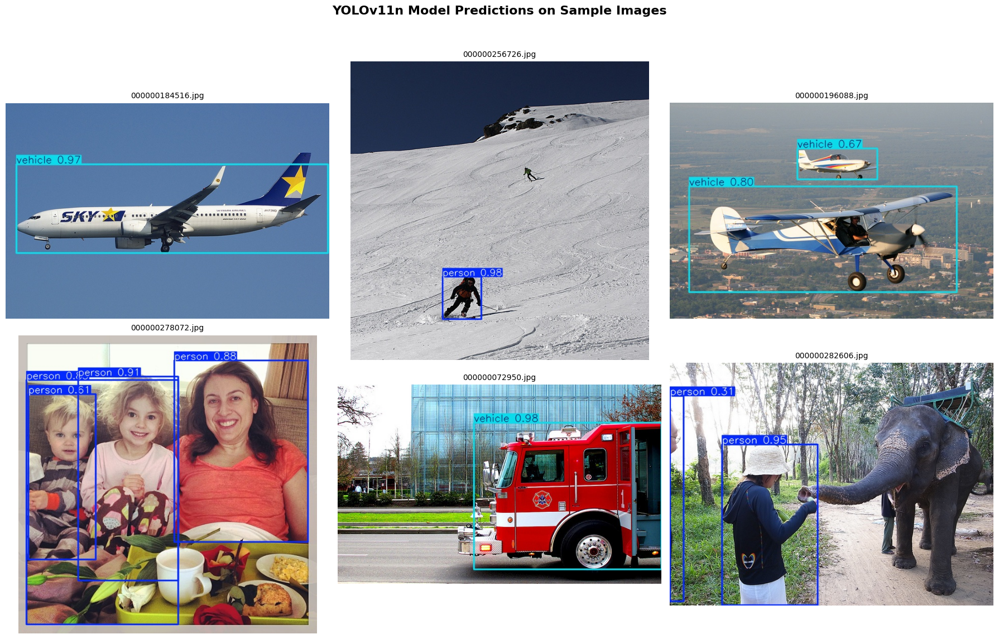

In [19]:
import random
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

# Get the directory where predict saved the results
prediction_output_dir = Path('/kaggle/working/runs/detect/predict')

# Get all image files from the prediction output directory
predicted_images = list(prediction_output_dir.glob('*.jpg')) + list(prediction_output_dir.glob('*.png'))

if predicted_images:
    # Select a random subset of images to display
    display_samples = random.sample(predicted_images, min(6, len(predicted_images)))

    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()

    for idx, img_path in enumerate(display_samples):
        img = Image.open(img_path)
        axes[idx].imshow(img)
        axes[idx].set_title(img_path.name, fontsize=10)
        axes[idx].axis('off')

    plt.suptitle('YOLOv11n Model Predictions on Sample Images', fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()
else:
    print("No predicted images found to display.")
